# Configurable Colorization Experiment
## Models A-F: U-Net and cGAN with configurable loss functions


## Configuration Section
### ⚙️ Edit this section to run different experiments (A-F)


In [1]:
# ============================================================
# EXPERIMENT CONFIGURATION
# ============================================================

# Model ID: Choose from 'A', 'B', 'C', 'D', 'E', 'F'
MODEL_ID = "C_PERCEPTUAL_LOW"

# Training hyperparameters
BATCH_SIZE = 64
IMG_SIZE = 256
EPOCHS = 50
SAVE_INTERVAL = 10
LEARNING_RATE = 2e-4

# Random seed for reproducibility
SEED = 42

# ============================================================
# MODEL CONFIGURATIONS
# ============================================================
# Model A: U-Net + L1 (pure regression)
# Model B: cGAN + L1 (pix2pix-style)
# Model C: cGAN + L1 + Perceptual (main proposed model)
# Model D: U-Net + Perceptual (no L1, no GAN)
# Model E: U-Net + L1 + Perceptual (no GAN)
# Model F: cGAN + Perceptual (no L1)
# ============================================================

MODEL_CONFIGS = {
    "A": {
        "description": "U-Net + L1 (pure regression)",
        "USE_GAN": False,
        "USE_L1": True,
        "USE_PERCEPTUAL": False,
        "LAMBDA_L1": 100.0,
        "LAMBDA_PERCEPTUAL": 0.0,
    },
    "B": {
        "description": "cGAN + L1 (pix2pix-style)",
        "USE_GAN": True,
        "USE_L1": True,
        "USE_PERCEPTUAL": False,
        "LAMBDA_L1": 100.0,
        "LAMBDA_PERCEPTUAL": 0.0,
    },
    "C": {
        "description": "cGAN + L1 + Perceptual (main proposed model)",
        "USE_GAN": True,
        "USE_L1": True,
        "USE_PERCEPTUAL": True,
        "LAMBDA_L1": 100.0,
        "LAMBDA_PERCEPTUAL": 10.0,
    },
    "D": {
        "description": "U-Net + Perceptual (no L1, no GAN)",
        "USE_GAN": False,
        "USE_L1": False,
        "USE_PERCEPTUAL": True,
        "LAMBDA_L1": 0.0,
        "LAMBDA_PERCEPTUAL": 10.0,
    },
    "E": {
        "description": "U-Net + L1 + Perceptual (no GAN)",
        "USE_GAN": False,
        "USE_L1": True,
        "USE_PERCEPTUAL": True,
        "LAMBDA_L1": 100.0,
        "LAMBDA_PERCEPTUAL": 10.0,
    },
    "F": {
        "description": "cGAN + Perceptual (no L1)",
        "USE_GAN": True,
        "USE_L1": False,
        "USE_PERCEPTUAL": True,
        "LAMBDA_L1": 0.0,
        "LAMBDA_PERCEPTUAL": 10.0,
    },
    "C_L1_LOW": {
        "description": "cGAN + L1 + Perceptual (main proposed model with low L1 weight)",
        "USE_GAN": True,
        "USE_L1": True,
        "USE_PERCEPTUAL": True,
        "LAMBDA_L1": 50.0,  # 0.5 times the usual weight
        "LAMBDA_PERCEPTUAL": 10.0,
    },
    "C_L1_HIGH": {
        "description": "cGAN + L1 + Perceptual (main proposed model with high L1 weight)",
        "USE_GAN": True,
        "USE_L1": True,
        "USE_PERCEPTUAL": True,
        "LAMBDA_L1": 200.0,  # 2 times the usual weight
        "LAMBDA_PERCEPTUAL": 10.0,
    },
    "C_PERCEPTUAL_LOW": {
        "description": "cGAN + L1 + Perceptual (main proposed model with low Perceptual weight)",
        "USE_GAN": True,
        "USE_L1": True,
        "USE_PERCEPTUAL": True,
        "LAMBDA_L1": 100.0,
        "LAMBDA_PERCEPTUAL": 5.0,  # 0.5 times the usual weight
    },
    "C_PERCEPTUAL_HIGH": {
        "description": "cGAN + L1 + Perceptual (main proposed model with high Perceptual weight)",
        "USE_GAN": True,
        "USE_L1": True,
        "USE_PERCEPTUAL": True,
        "LAMBDA_L1": 100.0,
        "LAMBDA_PERCEPTUAL": 20.0,  # 2 times the usual weight
    },
}

# Load selected configuration
if MODEL_ID not in MODEL_CONFIGS:
    raise ValueError(f"Invalid MODEL_ID '{MODEL_ID}'. Choose from: {list(MODEL_CONFIGS.keys())}")

config = MODEL_CONFIGS[MODEL_ID]
USE_GAN = config["USE_GAN"]
USE_L1 = config["USE_L1"]
USE_PERCEPTUAL = config["USE_PERCEPTUAL"]
LAMBDA_L1 = config["LAMBDA_L1"]
LAMBDA_PERCEPTUAL = config["LAMBDA_PERCEPTUAL"]

# Display configuration
print("=" * 60)
print(f"MODEL {MODEL_ID}: {config['description']}")
print("=" * 60)
print(f"GAN:              {USE_GAN}")
print(f"L1 Loss:          {USE_L1} (λ₁ = {LAMBDA_L1})")
print(f"Perceptual Loss:  {USE_PERCEPTUAL} (λ₂ = {LAMBDA_PERCEPTUAL})")
print(f"Epochs:           {EPOCHS}")
print(f"Batch Size:       {BATCH_SIZE}")
print(f"Learning Rate:    {LEARNING_RATE}")
print("=" * 60)


MODEL C_PERCEPTUAL_LOW: cGAN + L1 + Perceptual (main proposed model with low Perceptual weight)
GAN:              True
L1 Loss:          True (λ₁ = 100.0)
Perceptual Loss:  True (λ₂ = 5.0)
Epochs:           50
Batch Size:       64
Learning Rate:    0.0002


## Import Libraries


In [2]:
# Import necessary libraries
import glob
import random
import warnings
from pathlib import Path

import lpips
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import torch
from colormath.color_diff import delta_e_cie2000
from colormath.color_objects import LabColor
from PIL import Image
from skimage.color import lab2rgb, rgb2lab
from skimage.metrics import peak_signal_noise_ratio, structural_similarity
from torch import nn, optim
from torch.utils.data import DataLoader, Dataset
from torchsummary import summary
from torchvision import models, transforms
from tqdm import tqdm

# Suppress warnings
warnings.filterwarnings("ignore", category=UserWarning, message=".*negative Z values.*")


## Reproducibility Setup


In [3]:
# Set random seeds for reproducibility

random.seed(SEED)
np.random.seed(SEED)
torch.manual_seed(SEED)

if torch.cuda.is_available():
    torch.cuda.manual_seed(SEED)
    torch.cuda.manual_seed_all(SEED)  # For multi-GPU
    # Make CUDA operations deterministic
    torch.backends.cudnn.deterministic = True
    torch.backends.cudnn.benchmark = False

# For Apple Silicon (MPS)
if hasattr(torch.backends, "mps") and torch.backends.mps.is_available():
    torch.mps.manual_seed(SEED)

print(f"Random seed set to {SEED} for reproducibility")


Random seed set to 42 for reproducibility


## Device Configuration


In [4]:
# Device configuration
def get_device():
    if torch.cuda.is_available():
        dev = torch.device("cuda")
        name = torch.cuda.get_device_name(0)
    elif hasattr(torch.backends, "mps") and torch.backends.mps.is_available():
        dev = torch.device("mps")
        name = "Apple Silicon"
    else:
        dev = torch.device("cpu")
        name = "CPU"
    return dev, name


device, device_name = get_device()
print(f"Using device: {device_name} ({device})")


Using device: NVIDIA GeForce RTX 5060 Ti (cuda)


## Dataset Preparation


In [5]:
# Dataset class with data augmentation
class ColorizeDataset(Dataset):
    def __init__(self, root_dir, img_size=256, split="train"):
        self.root_dir = Path(root_dir)
        self.img_size = img_size
        self.split = split

        color_dir = self.root_dir / f"{split}_color"
        self.color_paths = sorted(glob.glob(str(color_dir / "*.jpg")))

        black_dir = self.root_dir / f"{split}_black"
        self.black_paths = sorted(glob.glob(str(black_dir / "*.jpg")))

        assert len(self.color_paths) == len(self.black_paths)

        # Data augmentation for training set
        if split == "train":
            self.transform = transforms.Compose([
                transforms.Resize((img_size, img_size)),
                transforms.RandomHorizontalFlip(p=0.5),
                transforms.RandomRotation(degrees=15),
                transforms.ColorJitter(brightness=0.2, contrast=0.2, saturation=0.2, hue=0.1),
                transforms.RandomAffine(degrees=0, translate=(0.1, 0.1)),
                transforms.ToTensor(),
            ])
        else:
            # No augmentation for validation and test sets
            self.transform = transforms.Compose([
                transforms.Resize((img_size, img_size)),
                transforms.ToTensor(),
            ])

        print(f"Loaded {len(self.color_paths)} {split} image pairs")

    def __len__(self):
        return len(self.color_paths)

    def __getitem__(self, idx):
        color_img = Image.open(self.color_paths[idx]).convert("RGB")
        color_img = self.transform(color_img)

        gray_img = Image.open(self.black_paths[idx]).convert("L")
        gray_img = self.transform(gray_img)

        color_img_np = (color_img.permute(1, 2, 0).numpy() * 255).astype(np.uint8)
        lab_img = rgb2lab(color_img_np)

        L = lab_img[:, :, 0] / 50.0 - 1.0
        ab = lab_img[:, :, 1:] / 128.0

        L = torch.from_numpy(L).unsqueeze(0).float()
        ab = torch.from_numpy(ab).permute(2, 0, 1).float()

        return L, ab, gray_img


# Load datasets
train_dataset = ColorizeDataset("../data/colorize_dataset/data", img_size=IMG_SIZE, split="train")
val_dataset = ColorizeDataset("../data/colorize_dataset/data", img_size=IMG_SIZE, split="val")
test_dataset = ColorizeDataset("../data/colorize_dataset/data", img_size=IMG_SIZE, split="test")

# Worker initialization function for reproducibility
def worker_init_fn(worker_id):
    np.random.seed(SEED + worker_id)
    random.seed(SEED + worker_id)

# Create data generators for reproducible shuffling
g = torch.Generator()
g.manual_seed(SEED)

train_loader = DataLoader(
    train_dataset,
    batch_size=BATCH_SIZE,
    shuffle=True,
    num_workers=0,
    pin_memory=True if torch.cuda.is_available() else False,
    worker_init_fn=worker_init_fn,
    generator=g,
)
val_loader = DataLoader(
    val_dataset,
    batch_size=BATCH_SIZE,
    shuffle=False,
    num_workers=0,
    pin_memory=True if torch.cuda.is_available() else False,
    worker_init_fn=worker_init_fn,
)
test_loader = DataLoader(
    test_dataset,
    batch_size=BATCH_SIZE,
    shuffle=False,
    num_workers=0,
    pin_memory=True if torch.cuda.is_available() else False,
    worker_init_fn=worker_init_fn,
)

# Display dataset statistics
print(f"\n{'=' * 60}")
print("Dataset Statistics:")
print(f"{'=' * 60}")
print(f"Training set:   {len(train_dataset):4d} images ({len(train_loader):3d} batches)")
print(f"Validation set: {len(val_dataset):4d} images ({len(val_loader):3d} batches)")
print(f"Test set:       {len(test_dataset):4d} images ({len(test_loader):3d} batches)")
print(f"Image size:     {IMG_SIZE}×{IMG_SIZE} pixels")
print(f"Batch size:     {BATCH_SIZE}")
print(f"{'=' * 60}\n")


Loaded 4750 train image pairs
Loaded 250 val image pairs
Loaded 739 test image pairs

Dataset Statistics:
Training set:   4750 images ( 75 batches)
Validation set:  250 images (  4 batches)
Test set:        739 images ( 12 batches)
Image size:     256×256 pixels
Batch size:     64



## Model Architecture
### U-Net Generator


In [6]:
# U-Net components
class UNetBlock(nn.Module):
    def __init__(self, in_channels, out_channels, down=True, use_dropout=False):
        super().__init__()
        if down:
            self.conv = nn.Sequential(
                nn.Conv2d(in_channels, out_channels, 4, 2, 1, bias=False),
                nn.BatchNorm2d(out_channels),
                nn.LeakyReLU(0.2, inplace=True),
            )
        else:
            self.conv = nn.Sequential(
                nn.ConvTranspose2d(in_channels, out_channels, 4, 2, 1, bias=False),
                nn.BatchNorm2d(out_channels),
                nn.ReLU(inplace=True),
            )

        self.use_dropout = use_dropout
        if use_dropout:
            self.dropout = nn.Dropout(0.5)

    def forward(self, x):
        x = self.conv(x)
        if self.use_dropout:
            x = self.dropout(x)
        return x


class UNetGenerator(nn.Module):
    def __init__(self, in_channels=1, out_channels=2):
        super().__init__()

        self.down1 = nn.Conv2d(in_channels, 64, 4, 2, 1)
        self.down2 = UNetBlock(64, 128, down=True)
        self.down3 = UNetBlock(128, 256, down=True)
        self.down4 = UNetBlock(256, 512, down=True)
        self.down5 = UNetBlock(512, 512, down=True)
        self.down6 = UNetBlock(512, 512, down=True)
        self.down7 = UNetBlock(512, 512, down=True)

        self.bottleneck = nn.Sequential(nn.Conv2d(512, 512, 4, 2, 1), nn.ReLU(inplace=True))

        self.up1 = UNetBlock(512, 512, down=False, use_dropout=True)
        self.up2 = UNetBlock(1024, 512, down=False, use_dropout=True)
        self.up3 = UNetBlock(1024, 512, down=False, use_dropout=True)
        self.up4 = UNetBlock(1024, 512, down=False)
        self.up5 = UNetBlock(1024, 256, down=False)
        self.up6 = UNetBlock(512, 128, down=False)
        self.up7 = UNetBlock(256, 64, down=False)

        self.final = nn.Sequential(nn.ConvTranspose2d(128, out_channels, 4, 2, 1), nn.Tanh())

    def forward(self, x):
        d1 = self.down1(x)
        d2 = self.down2(d1)
        d3 = self.down3(d2)
        d4 = self.down4(d3)
        d5 = self.down5(d4)
        d6 = self.down6(d5)
        d7 = self.down7(d6)

        bottleneck = self.bottleneck(d7)

        u1 = self.up1(bottleneck)
        u2 = self.up2(torch.cat([u1, d7], dim=1))
        u3 = self.up3(torch.cat([u2, d6], dim=1))
        u4 = self.up4(torch.cat([u3, d5], dim=1))
        u5 = self.up5(torch.cat([u4, d4], dim=1))
        u6 = self.up6(torch.cat([u5, d3], dim=1))
        u7 = self.up7(torch.cat([u6, d2], dim=1))

        output = self.final(torch.cat([u7, d1], dim=1))
        return output


# Initialize generator
generator = UNetGenerator(in_channels=1, out_channels=2).to(device)
print("✓ U-Net Generator initialized")
summary(generator, (1, IMG_SIZE, IMG_SIZE))


✓ U-Net Generator initialized
----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1         [-1, 64, 128, 128]           1,088
            Conv2d-2          [-1, 128, 64, 64]         131,072
       BatchNorm2d-3          [-1, 128, 64, 64]             256
         LeakyReLU-4          [-1, 128, 64, 64]               0
         UNetBlock-5          [-1, 128, 64, 64]               0
            Conv2d-6          [-1, 256, 32, 32]         524,288
       BatchNorm2d-7          [-1, 256, 32, 32]             512
         LeakyReLU-8          [-1, 256, 32, 32]               0
         UNetBlock-9          [-1, 256, 32, 32]               0
           Conv2d-10          [-1, 512, 16, 16]       2,097,152
      BatchNorm2d-11          [-1, 512, 16, 16]           1,024
        LeakyReLU-12          [-1, 512, 16, 16]               0
        UNetBlock-13          [-1, 512, 16, 16]               0
         

### PatchGAN Discriminator (for GAN models)


In [7]:
# PatchGAN Discriminator
class PatchGANDiscriminator(nn.Module):
    def __init__(self, in_channels=3):
        super().__init__()
        
        def discriminator_block(in_filters, out_filters, normalization=True):
            layers = [nn.Conv2d(in_filters, out_filters, 4, stride=2, padding=1)]
            if normalization:
                layers.append(nn.BatchNorm2d(out_filters))
            layers.append(nn.LeakyReLU(0.2, inplace=True))
            return layers

        self.model = nn.Sequential(
            *discriminator_block(in_channels, 64, normalization=False),
            *discriminator_block(64, 128),
            *discriminator_block(128, 256),
            *discriminator_block(256, 512),
            nn.ZeroPad2d((1, 0, 1, 0)),
            nn.Conv2d(512, 1, 4, padding=1)
        )

    def forward(self, img_L, img_ab):
        img_input = torch.cat((img_L, img_ab), 1)
        return self.model(img_input)


# Initialize discriminator if using GAN
if USE_GAN:
    discriminator = PatchGANDiscriminator(in_channels=3).to(device)
    print("✓ PatchGAN Discriminator initialized")
    summary(discriminator, [(1, IMG_SIZE, IMG_SIZE), (2, IMG_SIZE, IMG_SIZE)])
else:
    discriminator = None
    print("✗ Discriminator not used (non-GAN model)")


✓ PatchGAN Discriminator initialized
----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1         [-1, 64, 128, 128]           3,136
         LeakyReLU-2         [-1, 64, 128, 128]               0
            Conv2d-3          [-1, 128, 64, 64]         131,200
       BatchNorm2d-4          [-1, 128, 64, 64]             256
         LeakyReLU-5          [-1, 128, 64, 64]               0
            Conv2d-6          [-1, 256, 32, 32]         524,544
       BatchNorm2d-7          [-1, 256, 32, 32]             512
         LeakyReLU-8          [-1, 256, 32, 32]               0
            Conv2d-9          [-1, 512, 16, 16]       2,097,664
      BatchNorm2d-10          [-1, 512, 16, 16]           1,024
        LeakyReLU-11          [-1, 512, 16, 16]               0
        ZeroPad2d-12          [-1, 512, 17, 17]               0
           Conv2d-13            [-1, 1, 16, 16]           8,193
To

### Perceptual Loss Network (VGG16)


In [8]:
# Perceptual Loss using VGG16 (with proper gradient flow)
class PerceptualLoss(nn.Module):
    def __init__(self, device):
        super().__init__()
        # Load VGG16
        vgg = models.vgg16(weights=models.VGG16_Weights.IMAGENET1K_V1).features.to(device).eval()
        self.layers = nn.ModuleList([
            vgg[:4],    # relu1_2
            vgg[4:9],   # relu2_2
            vgg[9:16],  # relu3_3
        ])
        
        # Freeze VGG parameters
        for param in self.parameters():
            param.requires_grad = False
        
        # ImageNet Mean/Std normalization for VGG
        self.register_buffer("mean", torch.tensor([0.485, 0.456, 0.406]).view(1, 3, 1, 1).to(device))
        self.register_buffer("std", torch.tensor([0.229, 0.224, 0.225]).view(1, 3, 1, 1).to(device))
    
    def forward(self, generated, target):
        # Normalize input for VGG
        generated = (generated - self.mean) / self.std
        target = (target - self.mean) / self.std
        
        loss = 0.0
        x = generated
        y = target
        for layer in self.layers:
            x = layer(x)
            y = layer(y)
            loss += nn.functional.l1_loss(x, y)
        return loss


def lab_to_rgb_pytorch(L, ab):
    """
    Differentiable LAB to RGB conversion using PyTorch tensors.
    L: [B, 1, H, W], Range [-1, 1]
    ab: [B, 2, H, W], Range [-1, 1] (Normalized by 128)
    Output: [B, 3, H, W], Range [0, 1]
    """
    # 1. Denormalize to native LAB range
    L = (L + 1.0) * 50.0  # Range [0, 100]
    ab = ab * 128.0       # Range [-128, 128]
    
    L_chan = L
    a_chan = ab[:, 0:1, :, :]
    b_chan = ab[:, 1:2, :, :]

    # 2. Convert LAB to XYZ
    # Constants based on CIE standard
    y = (L_chan + 16.0) / 116.0
    x = (a_chan / 500.0) + y
    z = y - (b_chan / 200.0)

    def func(t):
        return torch.where(t > 0.2068966, t ** 3, (t - 16.0 / 116.0) / 7.787)

    x = func(x) * 95.047
    y = func(y) * 100.000
    z = func(z) * 108.883

    # 3. Convert XYZ to RGB
    # Conversion matrix
    R = x * 3.2406 + y * -1.5372 + z * -0.4986
    G = x * -0.9689 + y * 1.8758 + z * 0.0415
    B = x * 0.0557 + y * -0.2040 + z * 1.0570

    rgb = torch.cat([R, G, B], dim=1)
    
    # Clip values to [0, 1] because VGG expects valid image range
    rgb = torch.clamp(rgb / 255.0, 0.0, 1.0)
    
    return rgb


def lab_to_rgb_numpy(L, ab):
    """
    Convert LAB tensors to RGB using numpy/skimage (for visualization and evaluation).
    This is NOT differentiable but more accurate for color conversion.
    L: [B, 1, H, W], Range [-1, 1]
    ab: [B, 2, H, W], Range [-1, 1] (Normalized by 128)
    Output: numpy array [B, H, W, 3], Range [0, 1]
    """
    batch_size = L.size(0)
    rgb_images = []
    
    for i in range(batch_size):
        L_np = (L[i].detach().cpu().squeeze().numpy() + 1.0) * 50.0
        ab_np = ab[i].detach().cpu().permute(1, 2, 0).numpy() * 128.0
        
        lab = np.zeros((L_np.shape[0], L_np.shape[1], 3))
        lab[:, :, 0] = L_np
        lab[:, :, 1:] = ab_np
        
        rgb = lab2rgb(lab)
        rgb_images.append(rgb)
    
    return np.array(rgb_images)


# Initialize perceptual loss
if USE_PERCEPTUAL:
    perceptual_loss_fn = PerceptualLoss(device).to(device)
    print("✓ Perceptual Loss (VGG16) initialized")
else:
    perceptual_loss_fn = None
    print("✗ Perceptual Loss not used")


✓ Perceptual Loss (VGG16) initialized


## Training Setup


In [9]:
# Loss functions
l1_loss = nn.L1Loss()
adversarial_loss = nn.BCEWithLogitsLoss()

# Optimizers
optimizer_G = optim.Adam(generator.parameters(), lr=LEARNING_RATE, betas=(0.5, 0.999))

if USE_GAN:
    optimizer_D = optim.Adam(discriminator.parameters(), lr=LEARNING_RATE, betas=(0.5, 0.999))
else:
    optimizer_D = None

# Learning rate schedulers with linear decay
# Keep LR constant for first half, then linearly decay to zero
def lr_lambda(epoch):
    decay_start = EPOCHS // 2
    if epoch < decay_start:
        return 1.0
    else:
        return 1.0 - (epoch - decay_start) / (EPOCHS - decay_start)

scheduler_G = optim.lr_scheduler.LambdaLR(optimizer_G, lr_lambda=lr_lambda)

if USE_GAN:
    scheduler_D = optim.lr_scheduler.LambdaLR(optimizer_D, lr_lambda=lr_lambda)
else:
    scheduler_D = None

# Training history
history = {
    "epoch": [],
    "train_loss": [],
    "val_loss": [],
    "gen_loss": [],
}

if USE_GAN:
    history["disc_loss"] = []

# Create save directories
save_dir = Path(f"../models/{MODEL_ID}")
results_dir = Path(f"../results/{MODEL_ID}")
save_dir.mkdir(parents=True, exist_ok=True)
results_dir.mkdir(parents=True, exist_ok=True)

print(f"Model will be saved to: {save_dir}")
print(f"Results will be saved to: {results_dir}")


Model will be saved to: ..\models\C_PERCEPTUAL_LOW
Results will be saved to: ..\results\C_PERCEPTUAL_LOW


## Training Loop


In [10]:
# Training function
def train_epoch(generator, discriminator, train_loader, optimizer_G, optimizer_D, epoch, device):
    generator.train()
    if discriminator is not None:
        discriminator.train()
    
    epoch_gen_loss = 0.0
    epoch_disc_loss = 0.0

    pbar = tqdm(train_loader, desc=f"Epoch {epoch} [Train]")
    for L, ab_real, _ in pbar:
        L = L.to(device)
        ab_real = ab_real.to(device)
        batch_size = L.size(0)

        # ==================
        # Train Discriminator
        # ==================
        if USE_GAN:
            optimizer_D.zero_grad()
            
            # Real images
            real_pred = discriminator(L, ab_real)
            real_labels = torch.ones_like(real_pred)
            real_loss = adversarial_loss(real_pred, real_labels)
            
            # Fake images
            ab_fake = generator(L).detach()
            fake_pred = discriminator(L, ab_fake)
            fake_labels = torch.zeros_like(fake_pred)
            fake_loss = adversarial_loss(fake_pred, fake_labels)
            
            disc_loss = (real_loss + fake_loss) / 2
            disc_loss.backward()
            optimizer_D.step()
            
            epoch_disc_loss += disc_loss.item()

        # ==================
        # Train Generator
        # ==================
        optimizer_G.zero_grad()
        ab_fake = generator(L)
        
        # Compute generator loss
        gen_loss = 0.0
        
        # L1 loss
        if USE_L1:
            loss_l1 = l1_loss(ab_fake, ab_real) * LAMBDA_L1
            gen_loss += loss_l1
        
        # Adversarial loss
        if USE_GAN:
            fake_pred = discriminator(L, ab_fake)
            real_labels = torch.ones_like(fake_pred)
            loss_adv = adversarial_loss(fake_pred, real_labels)
            gen_loss += loss_adv
        
        # Perceptual loss
        if USE_PERCEPTUAL:
            rgb_fake = lab_to_rgb_pytorch(L, ab_fake)
            rgb_real = lab_to_rgb_pytorch(L, ab_real)
            loss_perceptual = perceptual_loss_fn(rgb_fake, rgb_real) * LAMBDA_PERCEPTUAL
            gen_loss += loss_perceptual
        
        gen_loss.backward()
        optimizer_G.step()

        epoch_gen_loss += gen_loss.item()
        
        # Update progress bar
        if USE_GAN:
            pbar.set_postfix({"G_Loss": f"{gen_loss.item():.4f}", "D_Loss": f"{disc_loss.item():.4f}"})
        else:
            pbar.set_postfix({"Loss": f"{gen_loss.item():.4f}"})

    avg_gen_loss = epoch_gen_loss / len(train_loader)
    avg_disc_loss = epoch_disc_loss / len(train_loader) if USE_GAN else 0.0
    
    return avg_gen_loss, avg_disc_loss


# Validation function
def validate_epoch(generator, val_loader, device):
    generator.eval()
    epoch_loss = 0.0

    with torch.no_grad():
        for L, ab_real, _ in tqdm(val_loader, desc="Validating", leave=False):
            L = L.to(device)
            ab_real = ab_real.to(device)

            ab_fake = generator(L)
            
            # Compute validation loss (L1 only for consistency)
            loss = l1_loss(ab_fake, ab_real)
            epoch_loss += loss.item()

    return epoch_loss / len(val_loader)


# Visualization function for validation samples
def visualize_validation_samples(generator, val_loader, device, epoch, save_dir, num_samples=5):
    generator.eval()

    with torch.no_grad():
        L, ab_real, gray_img = next(iter(val_loader))
        L = L[:num_samples].to(device)
        ab_real = ab_real[:num_samples]
        gray_img = gray_img[:num_samples]

        ab_fake = generator(L).cpu()
        L = L.cpu()

        fig, axes = plt.subplots(num_samples, 3, figsize=(12, 4 * num_samples))

        for i in range(num_samples):
            # Grayscale input
            axes[i, 0].imshow(gray_img[i].squeeze(), cmap="gray")
            axes[i, 0].set_title("Input (Grayscale)", fontweight="bold")
            axes[i, 0].axis("off")

            # Generated colorization
            L_np = (L[i].squeeze().numpy() + 1.0) * 50.0
            ab_fake_np = ab_fake[i].permute(1, 2, 0).numpy() * 128.0
            lab_fake = np.zeros((IMG_SIZE, IMG_SIZE, 3))
            lab_fake[:, :, 0] = L_np
            lab_fake[:, :, 1:] = ab_fake_np
            rgb_fake = lab2rgb(lab_fake)

            axes[i, 1].imshow(rgb_fake)
            axes[i, 1].set_title("Generated Color", fontweight="bold")
            axes[i, 1].axis("off")

            # Ground truth
            ab_real_np = ab_real[i].permute(1, 2, 0).numpy() * 128.0
            lab_real = np.zeros((IMG_SIZE, IMG_SIZE, 3))
            lab_real[:, :, 0] = L_np
            lab_real[:, :, 1:] = ab_real_np
            rgb_real = lab2rgb(lab_real)

            axes[i, 2].imshow(rgb_real)
            axes[i, 2].set_title("Ground Truth", fontweight="bold")
            axes[i, 2].axis("off")

        plt.suptitle(f"Model {MODEL_ID} - Validation Samples - Epoch {epoch}", fontsize=16, fontweight="bold", y=1.0)
        plt.tight_layout()

        output_path = save_dir / f"val_samples_{MODEL_ID}_epoch_{epoch}.png"
        plt.savefig(output_path, dpi=150, bbox_inches="tight")
        print(f"  ✓ Validation samples saved to: {output_path.name}")

        plt.show()


print("Training functions defined successfully")


Training functions defined successfully


### Start Training



Starting Training - Model C_PERCEPTUAL_LOW



Epoch 1 [Train]: 100%|██████████| 75/75 [02:23<00:00,  1.92s/it, G_Loss=22.6895, D_Loss=0.2995]



Epoch 1/50
  Generator Loss: 25.7083
  Discriminator Loss: 0.3951
  Validation Loss: 0.1627
  ✓ New best model saved! (Val Loss: 0.1627)


Epoch 2 [Train]: 100%|██████████| 75/75 [02:18<00:00,  1.85s/it, G_Loss=18.0125, D_Loss=0.0873]



Epoch 2/50
  Generator Loss: 18.3714
  Discriminator Loss: 0.2092
  Validation Loss: 0.1042
  ✓ New best model saved! (Val Loss: 0.1042)


Epoch 3 [Train]: 100%|██████████| 75/75 [02:20<00:00,  1.88s/it, G_Loss=19.8533, D_Loss=0.0860]



Epoch 3/50
  Generator Loss: 17.3231
  Discriminator Loss: 0.2513
  Validation Loss: 0.0999
  ✓ New best model saved! (Val Loss: 0.0999)


Epoch 4 [Train]: 100%|██████████| 75/75 [02:20<00:00,  1.87s/it, G_Loss=20.7544, D_Loss=0.2013]



Epoch 4/50
  Generator Loss: 16.8778
  Discriminator Loss: 0.3673
  Validation Loss: 0.1069


Epoch 5 [Train]: 100%|██████████| 75/75 [02:19<00:00,  1.87s/it, G_Loss=12.0843, D_Loss=0.7802]



Epoch 5/50
  Generator Loss: 16.0948
  Discriminator Loss: 0.4869
  Validation Loss: 0.1122


Epoch 6 [Train]: 100%|██████████| 75/75 [02:20<00:00,  1.87s/it, G_Loss=15.3337, D_Loss=0.8420]



Epoch 6/50
  Generator Loss: 16.1343
  Discriminator Loss: 0.4311
  Validation Loss: 0.0921
  ✓ New best model saved! (Val Loss: 0.0921)


Epoch 7 [Train]: 100%|██████████| 75/75 [02:19<00:00,  1.87s/it, G_Loss=18.4373, D_Loss=0.0139]



Epoch 7/50
  Generator Loss: 17.1572
  Discriminator Loss: 0.2201
  Validation Loss: 0.0973


Epoch 8 [Train]: 100%|██████████| 75/75 [02:19<00:00,  1.87s/it, G_Loss=20.7174, D_Loss=0.0501]



Epoch 8/50
  Generator Loss: 17.3349
  Discriminator Loss: 0.2761
  Validation Loss: 0.1006


Epoch 9 [Train]: 100%|██████████| 75/75 [02:19<00:00,  1.86s/it, G_Loss=20.1952, D_Loss=0.0081]



Epoch 9/50
  Generator Loss: 17.7237
  Discriminator Loss: 0.1278
  Validation Loss: 0.1052


Epoch 10 [Train]: 100%|██████████| 75/75 [02:19<00:00,  1.87s/it, G_Loss=17.5302, D_Loss=0.0056]



Epoch 10/50
  Generator Loss: 18.2181
  Discriminator Loss: 0.0069
  Validation Loss: 0.0911
  ✓ New best model saved! (Val Loss: 0.0911)
  ✓ Checkpoint saved at epoch 10
  ✓ Validation samples saved to: val_samples_C_PERCEPTUAL_LOW_epoch_10.png


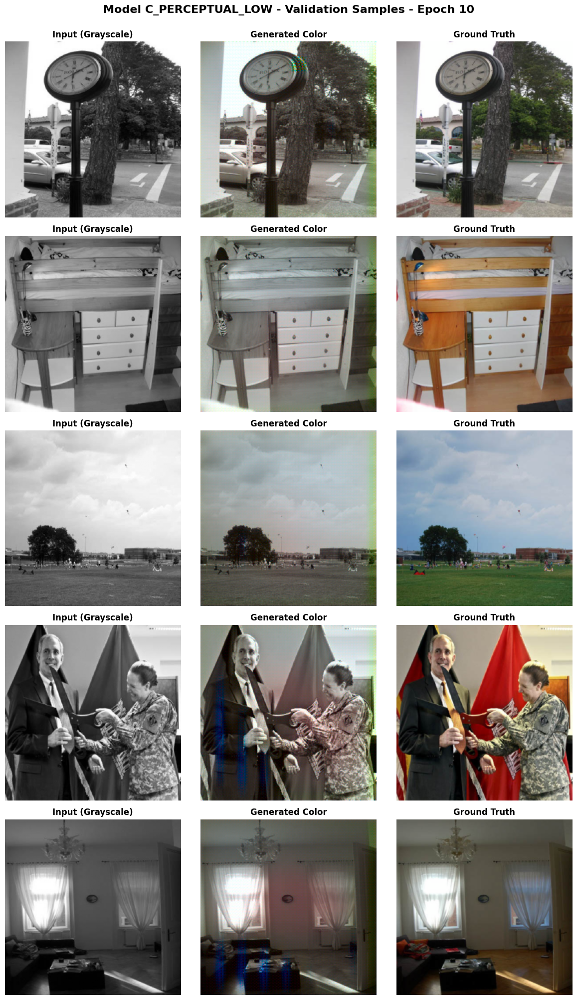

Epoch 11 [Train]: 100%|██████████| 75/75 [02:21<00:00,  1.89s/it, G_Loss=16.1361, D_Loss=0.0042]



Epoch 11/50
  Generator Loss: 17.7100
  Discriminator Loss: 0.0048
  Validation Loss: 0.0857
  ✓ New best model saved! (Val Loss: 0.0857)


Epoch 12 [Train]: 100%|██████████| 75/75 [02:20<00:00,  1.88s/it, G_Loss=18.2303, D_Loss=0.0032]



Epoch 12/50
  Generator Loss: 17.7912
  Discriminator Loss: 0.0048
  Validation Loss: 0.0853
  ✓ New best model saved! (Val Loss: 0.0853)


Epoch 13 [Train]: 100%|██████████| 75/75 [02:21<00:00,  1.88s/it, G_Loss=15.5556, D_Loss=0.0291]



Epoch 13/50
  Generator Loss: 18.3480
  Discriminator Loss: 0.0037
  Validation Loss: 0.0840
  ✓ New best model saved! (Val Loss: 0.0840)


Epoch 14 [Train]: 100%|██████████| 75/75 [02:20<00:00,  1.88s/it, G_Loss=17.1206, D_Loss=0.0013]



Epoch 14/50
  Generator Loss: 18.3035
  Discriminator Loss: 0.0018
  Validation Loss: 0.0798
  ✓ New best model saved! (Val Loss: 0.0798)


Epoch 15 [Train]: 100%|██████████| 75/75 [02:20<00:00,  1.87s/it, G_Loss=20.5242, D_Loss=0.0013]



Epoch 15/50
  Generator Loss: 18.4884
  Discriminator Loss: 0.0015
  Validation Loss: 0.0807


Epoch 16 [Train]: 100%|██████████| 75/75 [02:20<00:00,  1.87s/it, G_Loss=21.4002, D_Loss=0.0014]



Epoch 16/50
  Generator Loss: 18.9621
  Discriminator Loss: 0.0021
  Validation Loss: 0.0975


Epoch 17 [Train]: 100%|██████████| 75/75 [02:20<00:00,  1.87s/it, G_Loss=19.1571, D_Loss=0.0027]



Epoch 17/50
  Generator Loss: 18.3186
  Discriminator Loss: 0.0013
  Validation Loss: 0.1546


Epoch 18 [Train]: 100%|██████████| 75/75 [02:20<00:00,  1.87s/it, G_Loss=18.8631, D_Loss=0.0012]



Epoch 18/50
  Generator Loss: 19.2425
  Discriminator Loss: 0.0020
  Validation Loss: 0.0823


Epoch 19 [Train]: 100%|██████████| 75/75 [03:15<00:00,  2.61s/it, G_Loss=18.3176, D_Loss=0.0010]



Epoch 19/50
  Generator Loss: 18.0286
  Discriminator Loss: 0.0012
  Validation Loss: 0.0798


Epoch 20 [Train]: 100%|██████████| 75/75 [03:15<00:00,  2.61s/it, G_Loss=17.1491, D_Loss=0.0014]



Epoch 20/50
  Generator Loss: 17.8908
  Discriminator Loss: 0.0014
  Validation Loss: 0.0824
  ✓ Checkpoint saved at epoch 20
  ✓ Validation samples saved to: val_samples_C_PERCEPTUAL_LOW_epoch_20.png


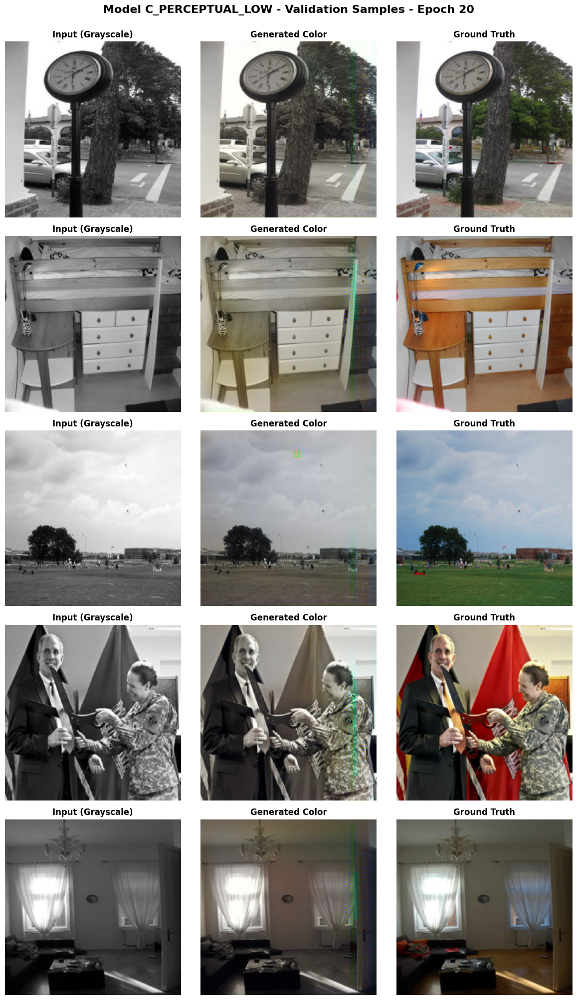

Epoch 21 [Train]: 100%|██████████| 75/75 [02:19<00:00,  1.86s/it, G_Loss=12.9319, D_Loss=0.4252]



Epoch 21/50
  Generator Loss: 17.9702
  Discriminator Loss: 0.1398
  Validation Loss: 0.0922


Epoch 22 [Train]: 100%|██████████| 75/75 [02:19<00:00,  1.86s/it, G_Loss=14.9981, D_Loss=0.3435]



Epoch 22/50
  Generator Loss: 14.2035
  Discriminator Loss: 0.5353
  Validation Loss: 0.1049


Epoch 23 [Train]: 100%|██████████| 75/75 [02:20<00:00,  1.88s/it, G_Loss=15.1875, D_Loss=0.3578]



Epoch 23/50
  Generator Loss: 14.7973
  Discriminator Loss: 0.4976
  Validation Loss: 0.1034


Epoch 24 [Train]: 100%|██████████| 75/75 [02:20<00:00,  1.87s/it, G_Loss=15.4538, D_Loss=0.2498]



Epoch 24/50
  Generator Loss: 15.3561
  Discriminator Loss: 0.3934
  Validation Loss: 0.1042


Epoch 25 [Train]: 100%|██████████| 75/75 [02:20<00:00,  1.88s/it, G_Loss=22.0808, D_Loss=0.0081]



Epoch 25/50
  Generator Loss: 17.3074
  Discriminator Loss: 0.0339
  Validation Loss: 0.1278


Epoch 26 [Train]: 100%|██████████| 75/75 [02:20<00:00,  1.87s/it, G_Loss=16.1874, D_Loss=0.0089]



Epoch 26/50
  Generator Loss: 17.9402
  Discriminator Loss: 0.0059
  Validation Loss: 0.0860


Epoch 27 [Train]: 100%|██████████| 75/75 [02:19<00:00,  1.86s/it, G_Loss=19.0139, D_Loss=0.0015]



Epoch 27/50
  Generator Loss: 18.2825
  Discriminator Loss: 0.0035
  Validation Loss: 0.0837


Epoch 28 [Train]: 100%|██████████| 75/75 [02:20<00:00,  1.87s/it, G_Loss=18.5805, D_Loss=0.0014]



Epoch 28/50
  Generator Loss: 18.2436
  Discriminator Loss: 0.0024
  Validation Loss: 0.0854


Epoch 29 [Train]: 100%|██████████| 75/75 [02:19<00:00,  1.86s/it, G_Loss=19.1104, D_Loss=0.0011]



Epoch 29/50
  Generator Loss: 18.6040
  Discriminator Loss: 0.0021
  Validation Loss: 0.0845


Epoch 30 [Train]: 100%|██████████| 75/75 [02:19<00:00,  1.87s/it, G_Loss=17.9886, D_Loss=0.0026]



Epoch 30/50
  Generator Loss: 18.2411
  Discriminator Loss: 0.0012
  Validation Loss: 0.0813
  ✓ Checkpoint saved at epoch 30
  ✓ Validation samples saved to: val_samples_C_PERCEPTUAL_LOW_epoch_30.png


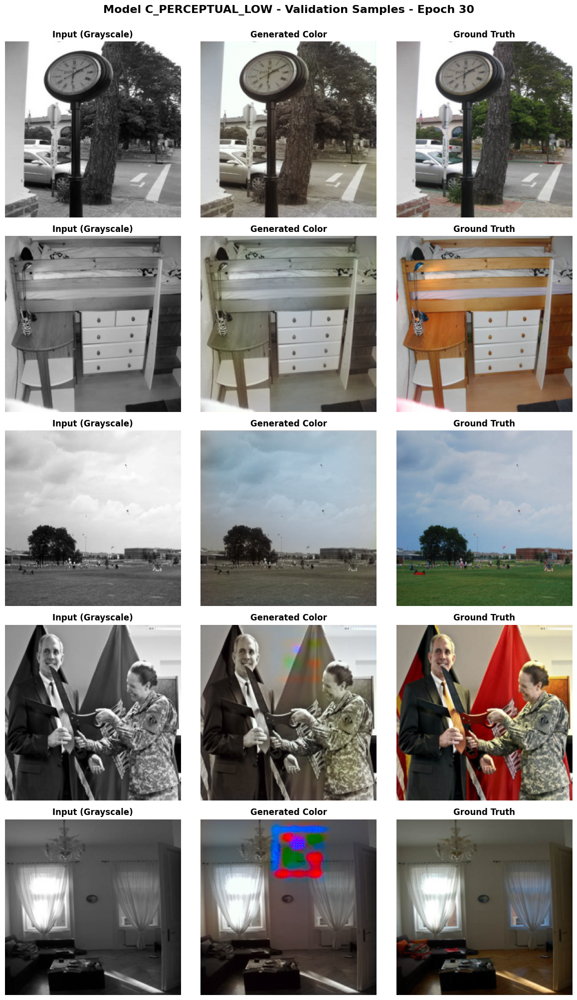

Epoch 31 [Train]: 100%|██████████| 75/75 [02:19<00:00,  1.86s/it, G_Loss=20.3095, D_Loss=0.0008]



Epoch 31/50
  Generator Loss: 18.3043
  Discriminator Loss: 0.0011
  Validation Loss: 0.0984


Epoch 32 [Train]: 100%|██████████| 75/75 [02:19<00:00,  1.86s/it, G_Loss=19.6745, D_Loss=0.0011]



Epoch 32/50
  Generator Loss: 18.7180
  Discriminator Loss: 0.0045
  Validation Loss: 0.0880


Epoch 33 [Train]: 100%|██████████| 75/75 [02:20<00:00,  1.87s/it, G_Loss=18.0496, D_Loss=0.0006]



Epoch 33/50
  Generator Loss: 18.5224
  Discriminator Loss: 0.0013
  Validation Loss: 0.0783
  ✓ New best model saved! (Val Loss: 0.0783)


Epoch 34 [Train]: 100%|██████████| 75/75 [02:19<00:00,  1.86s/it, G_Loss=20.5495, D_Loss=0.0028]



Epoch 34/50
  Generator Loss: 18.2485
  Discriminator Loss: 0.0008
  Validation Loss: 0.0953


Epoch 35 [Train]: 100%|██████████| 75/75 [02:19<00:00,  1.86s/it, G_Loss=11.9773, D_Loss=0.8847]



Epoch 35/50
  Generator Loss: 15.5114
  Discriminator Loss: 0.3480
  Validation Loss: 0.0945


Epoch 36 [Train]: 100%|██████████| 75/75 [02:19<00:00,  1.86s/it, G_Loss=14.2590, D_Loss=0.3099]



Epoch 36/50
  Generator Loss: 13.3331
  Discriminator Loss: 0.4746
  Validation Loss: 0.0905


Epoch 37 [Train]: 100%|██████████| 75/75 [02:19<00:00,  1.86s/it, G_Loss=17.5639, D_Loss=0.7133]



Epoch 37/50
  Generator Loss: 14.2026
  Discriminator Loss: 0.4844
  Validation Loss: 0.1137


Epoch 38 [Train]: 100%|██████████| 75/75 [02:18<00:00,  1.85s/it, G_Loss=16.6385, D_Loss=0.6951]



Epoch 38/50
  Generator Loss: 14.6709
  Discriminator Loss: 0.4246
  Validation Loss: 0.0900


Epoch 39 [Train]: 100%|██████████| 75/75 [02:17<00:00,  1.84s/it, G_Loss=14.4560, D_Loss=0.4618]



Epoch 39/50
  Generator Loss: 15.2194
  Discriminator Loss: 0.3194
  Validation Loss: 0.1050


Epoch 40 [Train]: 100%|██████████| 75/75 [02:19<00:00,  1.86s/it, G_Loss=19.1824, D_Loss=0.3828]



Epoch 40/50
  Generator Loss: 15.2198
  Discriminator Loss: 0.3468
  Validation Loss: 0.1442
  ✓ Checkpoint saved at epoch 40
  ✓ Validation samples saved to: val_samples_C_PERCEPTUAL_LOW_epoch_40.png


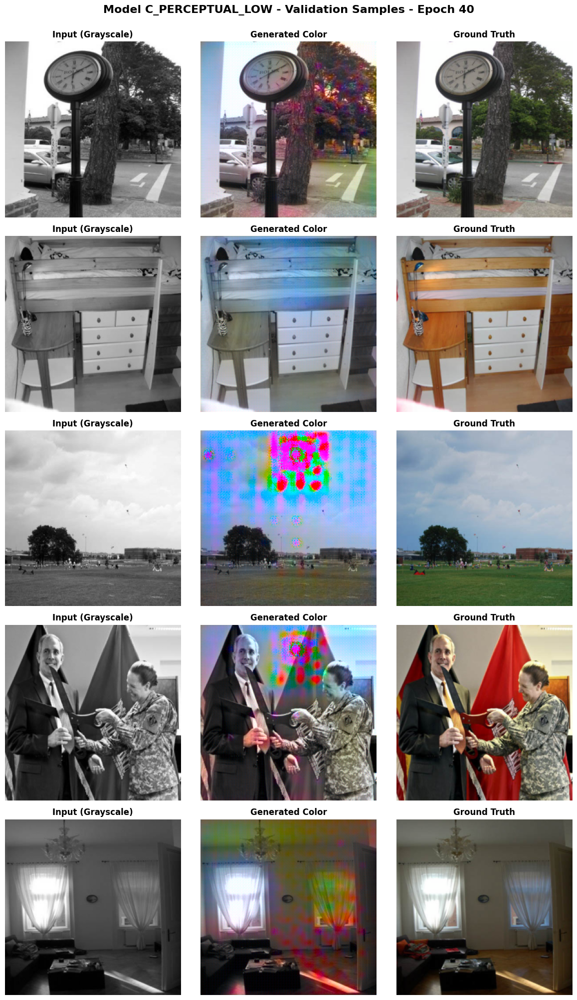

Epoch 41 [Train]: 100%|██████████| 75/75 [02:19<00:00,  1.86s/it, G_Loss=21.3483, D_Loss=0.1270]



Epoch 41/50
  Generator Loss: 16.3075
  Discriminator Loss: 0.2209
  Validation Loss: 0.1034


Epoch 42 [Train]: 100%|██████████| 75/75 [02:19<00:00,  1.86s/it, G_Loss=13.7347, D_Loss=0.3455]



Epoch 42/50
  Generator Loss: 16.3477
  Discriminator Loss: 0.2254
  Validation Loss: 0.0990


Epoch 43 [Train]: 100%|██████████| 75/75 [02:20<00:00,  1.87s/it, G_Loss=18.3681, D_Loss=0.0637]



Epoch 43/50
  Generator Loss: 16.0838
  Discriminator Loss: 0.2559
  Validation Loss: 0.1269


Epoch 44 [Train]: 100%|██████████| 75/75 [02:20<00:00,  1.87s/it, G_Loss=16.0663, D_Loss=0.6028]



Epoch 44/50
  Generator Loss: 16.0665
  Discriminator Loss: 0.2546
  Validation Loss: 0.1385


Epoch 45 [Train]: 100%|██████████| 75/75 [02:19<00:00,  1.87s/it, G_Loss=16.0937, D_Loss=0.1976]



Epoch 45/50
  Generator Loss: 16.0330
  Discriminator Loss: 0.2566
  Validation Loss: 0.1017


Epoch 46 [Train]: 100%|██████████| 75/75 [02:19<00:00,  1.87s/it, G_Loss=26.5974, D_Loss=0.3015]



Epoch 46/50
  Generator Loss: 16.0910
  Discriminator Loss: 0.1862
  Validation Loss: 0.1210


Epoch 47 [Train]: 100%|██████████| 75/75 [02:19<00:00,  1.86s/it, G_Loss=19.0711, D_Loss=0.0708]



Epoch 47/50
  Generator Loss: 15.8725
  Discriminator Loss: 0.1453
  Validation Loss: 0.1053


Epoch 48 [Train]: 100%|██████████| 75/75 [02:20<00:00,  1.87s/it, G_Loss=21.6844, D_Loss=0.2077]



Epoch 48/50
  Generator Loss: 15.5549
  Discriminator Loss: 0.2206
  Validation Loss: 0.1019


Epoch 49 [Train]: 100%|██████████| 75/75 [02:19<00:00,  1.86s/it, G_Loss=18.3316, D_Loss=0.1185]



Epoch 49/50
  Generator Loss: 15.5252
  Discriminator Loss: 0.2028
  Validation Loss: 0.0965


Epoch 50 [Train]: 100%|██████████| 75/75 [02:20<00:00,  1.87s/it, G_Loss=17.3104, D_Loss=0.2124]



Epoch 50/50
  Generator Loss: 15.0392
  Discriminator Loss: 0.2618
  Validation Loss: 0.0940
  ✓ Checkpoint saved at epoch 50
  ✓ Validation samples saved to: val_samples_C_PERCEPTUAL_LOW_epoch_50.png


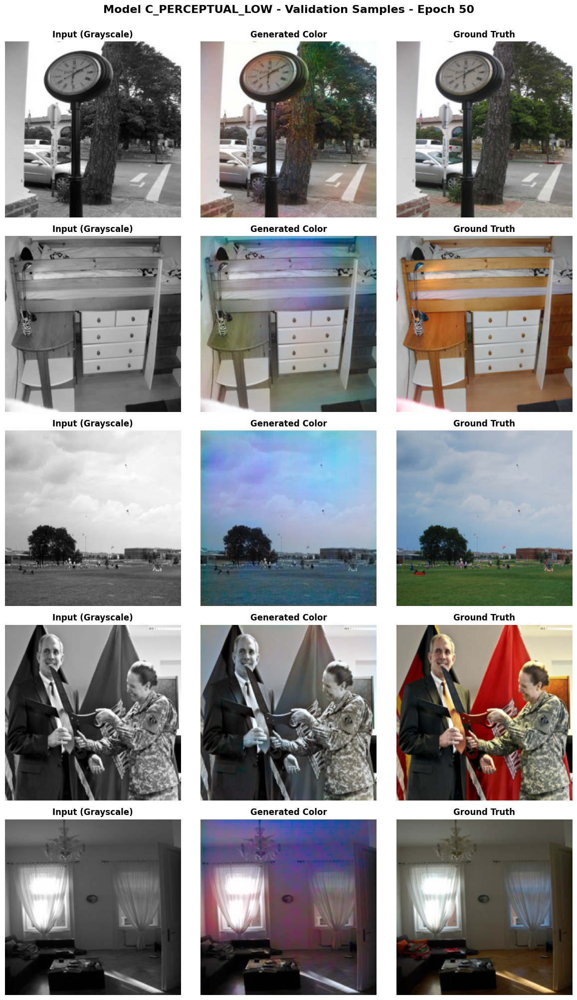


Training completed!
Best Validation Loss: 0.0783
Training history saved to: ..\results\C_PERCEPTUAL_LOW\training_history_C_PERCEPTUAL_LOW.csv



In [11]:
# Train model
best_val_loss = float("inf")

print(f"\n{'=' * 60}")
print(f"Starting Training - Model {MODEL_ID}")
print(f"{'=' * 60}\n")

for epoch in range(1, EPOCHS + 1):
    # Train
    avg_gen_loss, avg_disc_loss = train_epoch(
        generator, discriminator, train_loader, optimizer_G, optimizer_D, epoch, device
    )

    # Validate
    avg_val_loss = validate_epoch(generator, val_loader, device)

    # Update history
    history["epoch"].append(epoch)
    history["train_loss"].append(avg_gen_loss)
    history["val_loss"].append(avg_val_loss)
    history["gen_loss"].append(avg_gen_loss)
    
    if USE_GAN:
        history["disc_loss"].append(avg_disc_loss)

    print(f"\nEpoch {epoch}/{EPOCHS}")
    print(f"  Generator Loss: {avg_gen_loss:.4f}")
    if USE_GAN:
        print(f"  Discriminator Loss: {avg_disc_loss:.4f}")
    print(f"  Validation Loss: {avg_val_loss:.4f}")

    # Save best model based on validation loss
    if avg_val_loss < best_val_loss:
        best_val_loss = avg_val_loss
        checkpoint = {
            "epoch": epoch,
            "model_id": MODEL_ID,
            "generator_state_dict": generator.state_dict(),
            "optimizer_G_state_dict": optimizer_G.state_dict(),
            "history": history,
            "best_val_loss": best_val_loss,
            "best_train_loss": avg_gen_loss,
            "config": config,
        }
        
        if USE_GAN:
            checkpoint["discriminator_state_dict"] = discriminator.state_dict()
            checkpoint["optimizer_D_state_dict"] = optimizer_D.state_dict()
        
        torch.save(checkpoint, save_dir / "best_model.pt")
        print(f"  ✓ New best model saved! (Val Loss: {best_val_loss:.4f})")

    # Save checkpoint at intervals
    if epoch % SAVE_INTERVAL == 0:
        checkpoint_path = save_dir / f"checkpoint_epoch_{epoch}.pt"
        torch.save(checkpoint, checkpoint_path)
        print(f"  ✓ Checkpoint saved at epoch {epoch}")

        # Visualize validation samples
        visualize_validation_samples(generator, val_loader, device, epoch, results_dir)

    # Save training history to CSV after each epoch
    history_df = pd.DataFrame(history)
    history_csv_path = results_dir / f"training_history_{MODEL_ID}.csv"
    history_df.to_csv(history_csv_path, index=False)

    # Step learning rate schedulers
    scheduler_G.step()
    if scheduler_D is not None:
        scheduler_D.step()

    # Clear cache
    if torch.cuda.is_available():
        torch.cuda.empty_cache()

print(f"\n{'=' * 60}")
print("Training completed!")
print(f"Best Validation Loss: {best_val_loss:.4f}")
print(f"Training history saved to: {history_csv_path}")
print(f"{'=' * 60}\n")


In [12]:
# Patch numpy for colormath compatibility
if not hasattr(np, "asscalar"):
    np.asscalar = lambda x: x.item() if hasattr(x, "item") else float(x)


# Evaluation metrics class
class ColorimetricEvaluator:
    def __init__(self, device):
        self.device = device
        self.lpips_model = lpips.LPIPS(net="alex").to(device)
        self.lpips_model.eval()

    def calculate_psnr(self, L, ab_generated, ab_target):
        """Calculate PSNR on RGB images (standard for image restoration)"""
        # Convert to RGB numpy arrays (Range 0-1)
        rgb_gen = lab_to_rgb_numpy(L, ab_generated)
        rgb_target = lab_to_rgb_numpy(L, ab_target)
        
        psnr_values = []
        for i in range(rgb_gen.shape[0]):
            # Calculate PSNR on RGB images
            # data_range must be 1.0 because lab_to_rgb_numpy returns [0,1]
            psnr = peak_signal_noise_ratio(rgb_target[i], rgb_gen[i], data_range=1.0)
            psnr_values.append(psnr)
        return np.mean(psnr_values)

    def calculate_ssim(self, L, ab_generated, ab_target):
        """Calculate SSIM on RGB images (not ab channels which lack structure)"""
        # Convert to RGB numpy arrays (Range 0-1)
        rgb_gen = lab_to_rgb_numpy(L, ab_generated)
        rgb_target = lab_to_rgb_numpy(L, ab_target)
        
        ssim_values = []
        for i in range(rgb_gen.shape[0]):
            # Calculate SSIM on RGB images
            # data_range must be 1.0 because lab_to_rgb_numpy returns [0,1]
            ssim = structural_similarity(
                rgb_target[i], 
                rgb_gen[i], 
                data_range=1.0, 
                channel_axis=2
            )
            ssim_values.append(ssim)
        return np.mean(ssim_values)

    def calculate_ciede2000(self, L, ab_generated, ab_target):
        """Calculate CIEDE2000 color difference metric"""
        L_np = (L.cpu().numpy() + 1.0) * 50.0
        ab_gen_np = ab_generated.cpu().numpy() * 128.0
        ab_target_np = ab_target.cpu().numpy() * 128.0

        delta_e_values = []
        for b in range(L_np.shape[0]):
            L_channel = L_np[b, 0]
            # Changed from step=8 for sampling to reduce computation time and still get good estimate
            step = 8
            sample_indices = [
                (i, j)
                for i in range(0, L_channel.shape[0], step)
                for j in range(0, L_channel.shape[1], step)
            ]

            pixel_deltas = []
            for i, j in sample_indices:
                lab_gen = LabColor(L_channel[i, j], ab_gen_np[b, 0, i, j], ab_gen_np[b, 1, i, j])
                lab_target = LabColor(
                    L_channel[i, j], ab_target_np[b, 0, i, j], ab_target_np[b, 1, i, j]
                )
                delta_e = delta_e_cie2000(lab_gen, lab_target)
                pixel_deltas.append(delta_e)

            delta_e_values.append(np.mean(pixel_deltas))
        return np.mean(delta_e_values)

    def calculate_lpips(self, L, ab_generated, ab_target):
        with torch.no_grad():
            # Use numpy conversion for accurate color space transformation
            rgb_gen_np = lab_to_rgb_numpy(L, ab_generated)
            rgb_target_np = lab_to_rgb_numpy(L, ab_target)

            # Convert to tensor for LPIPS (expects range [-1, 1])
            rgb_gen_tensor = (
                torch.from_numpy(rgb_gen_np).permute(0, 3, 1, 2).float() * 2 - 1
            ).to(self.device)
            rgb_target_tensor = (
                torch.from_numpy(rgb_target_np).permute(0, 3, 1, 2).float() * 2 - 1
            ).to(self.device)

            lpips_value = self.lpips_model(rgb_gen_tensor, rgb_target_tensor)
            return lpips_value.mean().item()

    def evaluate_batch(self, L, ab_generated, ab_target):
        """Evaluate batch with all metrics - now passing L to PSNR and SSIM for RGB conversion"""
        metrics = {
            "PSNR": self.calculate_psnr(L, ab_generated, ab_target),
            "SSIM": self.calculate_ssim(L, ab_generated, ab_target),
            "CIEDE2000": self.calculate_ciede2000(L, ab_generated, ab_target),
            "LPIPS": self.calculate_lpips(L, ab_generated, ab_target),
        }
        return metrics


evaluator = ColorimetricEvaluator(device)
print("Evaluator initialized")


Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]


c:\Users\USER\Documents\Dechathon_N\AIT\Computer Vision\Colorized-Image-Project\.venv\Lib\site-packages\torchvision\models\_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
c:\Users\USER\Documents\Dechathon_N\AIT\Computer Vision\Colorized-Image-Project\.venv\Lib\site-packages\torchvision\models\_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=AlexNet_Weights.IMAGENET1K_V1`. You can also use `weights=AlexNet_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Loading model from: c:\Users\USER\Documents\Dechathon_N\AIT\Computer Vision\Colorized-Image-Project\.venv\Lib\site-packages\lpips\weights\v0.1\alex.pth
Evaluator initialized


In [13]:
# Evaluate on test set
generator.eval()

metrics_sum = {"PSNR": 0.0, "SSIM": 0.0, "CIEDE2000": 0.0, "LPIPS": 0.0}
num_evaluated = 0

print(f"Evaluating Model {MODEL_ID} on test set...")
with torch.no_grad():
    for L, ab_real, _ in tqdm(test_loader, desc="Evaluating"):
        L = L.to(device)
        ab_real = ab_real.to(device)

        ab_fake = generator(L)
        batch_metrics = evaluator.evaluate_batch(L, ab_fake, ab_real)

        for key in metrics_sum:
            metrics_sum[key] += batch_metrics[key]

        num_evaluated += 1

# Average metrics
metrics_avg = {key: val / num_evaluated for key, val in metrics_sum.items()}

print(f"\n{'=' * 60}")
print(f"Model {MODEL_ID} Evaluation Results:")
print(f"{'=' * 60}")
print(f"PSNR:        {metrics_avg['PSNR']:.4f} dB")
print(f"SSIM:        {metrics_avg['SSIM']:.4f}")
print(f"CIEDE2000:   {metrics_avg['CIEDE2000']:.4f}")
print(f"LPIPS:       {metrics_avg['LPIPS']:.4f}")
print(f"{'=' * 60}\n")


Evaluating Model C_PERCEPTUAL_LOW on test set...


Evaluating: 100%|██████████| 12/12 [01:28<00:00,  7.36s/it]


Model C_PERCEPTUAL_LOW Evaluation Results:
PSNR:        20.8660 dB
SSIM:        0.8420
CIEDE2000:   13.1506
LPIPS:       0.2524



## Save Results


✓ Metrics saved to: ..\results\C_PERCEPTUAL_LOW\metrics_C_PERCEPTUAL_LOW.csv
✓ Training plot saved to: ..\results\C_PERCEPTUAL_LOW\training_history_C_PERCEPTUAL_LOW.png


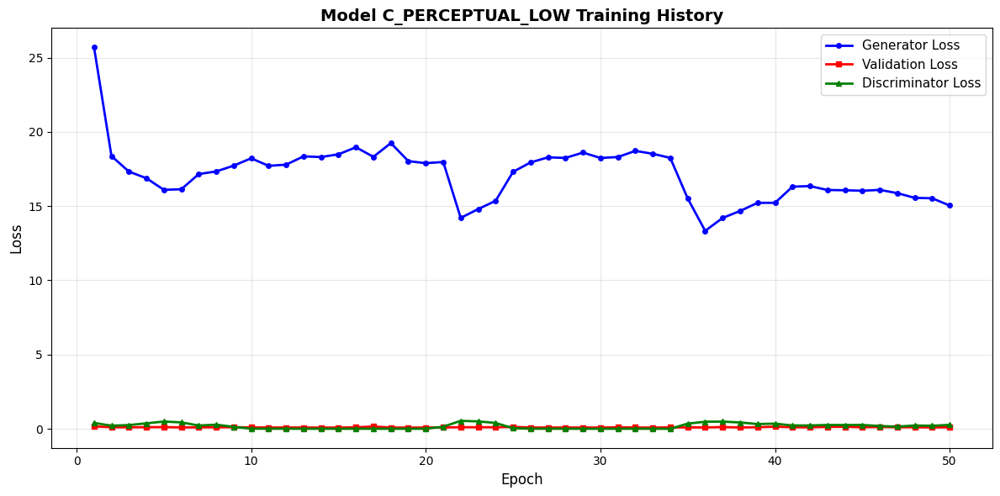

In [14]:
# Save metrics to CSV
metrics_df = pd.DataFrame([
    {
        "Model_ID": MODEL_ID,
        "Description": config["description"],
        "Architecture": "U-Net",
        "GAN": USE_GAN,
        "L1_Loss": USE_L1,
        "Perceptual_Loss": USE_PERCEPTUAL,
        "Lambda_L1": LAMBDA_L1,
        "Lambda_Perceptual": LAMBDA_PERCEPTUAL,
        "PSNR": metrics_avg["PSNR"],
        "SSIM": metrics_avg["SSIM"],
        "CIEDE2000": metrics_avg["CIEDE2000"],
        "LPIPS": metrics_avg["LPIPS"],
        "Best_Val_Loss": best_val_loss,
        "Epochs": EPOCHS,
    }
])

csv_path = results_dir / f"metrics_{MODEL_ID}.csv"
metrics_df.to_csv(csv_path, index=False)
print(f"✓ Metrics saved to: {csv_path}")

# Save training history plot
plt.figure(figsize=(12, 6))
plt.plot(
    history["epoch"],
    history["gen_loss"],
    "b-",
    linewidth=2,
    label="Generator Loss",
    marker="o",
    markersize=4,
)
plt.plot(
    history["epoch"],
    history["val_loss"],
    "r-",
    linewidth=2,
    label="Validation Loss",
    marker="s",
    markersize=4,
)
if USE_GAN:
    plt.plot(
        history["epoch"],
        history["disc_loss"],
        "g-",
        linewidth=2,
        label="Discriminator Loss",
        marker="^",
        markersize=4,
    )
plt.xlabel("Epoch", fontsize=12)
plt.ylabel("Loss", fontsize=12)
plt.title(f"Model {MODEL_ID} Training History", fontsize=14, fontweight="bold")
plt.grid(True, alpha=0.3)
plt.legend(fontsize=11)
plt.tight_layout()

plot_path = results_dir / f"training_history_{MODEL_ID}.png"
plt.savefig(plot_path, dpi=150, bbox_inches="tight")
print(f"✓ Training plot saved to: {plot_path}")
plt.show()


## Visualize Results


✓ Visualization saved to: ..\results\C_PERCEPTUAL_LOW\colorization_results_C_PERCEPTUAL_LOW.png


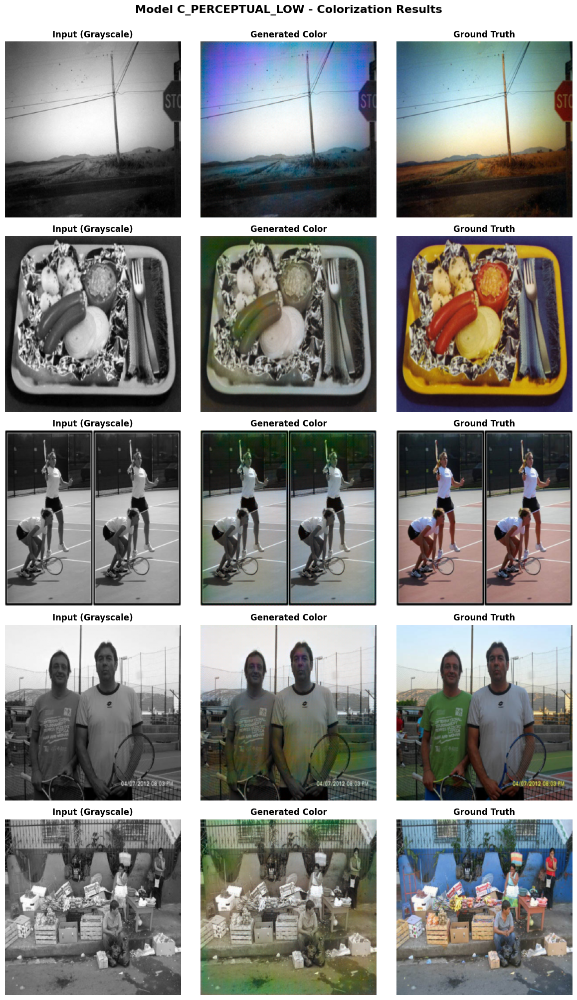


Model C_PERCEPTUAL_LOW - Training and Evaluation Complete!
Models saved in: ..\models\C_PERCEPTUAL_LOW
Results saved in: ..\results\C_PERCEPTUAL_LOW


In [15]:
# Visualize and save sample results
generator.eval()
num_samples = 5

with torch.no_grad():
    L, ab_real, gray_img = next(iter(test_loader))
    L = L[:num_samples].to(device)
    ab_real = ab_real[:num_samples]
    gray_img = gray_img[:num_samples]

    ab_fake = generator(L).cpu()
    L = L.cpu()

    fig, axes = plt.subplots(num_samples, 3, figsize=(12, 4 * num_samples))

    for i in range(num_samples):
        # Grayscale input
        axes[i, 0].imshow(gray_img[i].squeeze(), cmap="gray")
        axes[i, 0].set_title("Input (Grayscale)", fontweight="bold")
        axes[i, 0].axis("off")

        # Generated colorization
        L_np = (L[i].squeeze().numpy() + 1.0) * 50.0
        ab_fake_np = ab_fake[i].permute(1, 2, 0).numpy() * 128.0
        lab_fake = np.zeros((IMG_SIZE, IMG_SIZE, 3))
        lab_fake[:, :, 0] = L_np
        lab_fake[:, :, 1:] = ab_fake_np
        rgb_fake = lab2rgb(lab_fake)

        axes[i, 1].imshow(rgb_fake)
        axes[i, 1].set_title("Generated Color", fontweight="bold")
        axes[i, 1].axis("off")

        # Ground truth
        ab_real_np = ab_real[i].permute(1, 2, 0).numpy() * 128.0
        lab_real = np.zeros((IMG_SIZE, IMG_SIZE, 3))
        lab_real[:, :, 0] = L_np
        lab_real[:, :, 1:] = ab_real_np
        rgb_real = lab2rgb(lab_real)

        axes[i, 2].imshow(rgb_real)
        axes[i, 2].set_title("Ground Truth", fontweight="bold")
        axes[i, 2].axis("off")

    plt.suptitle(f"Model {MODEL_ID} - Colorization Results", fontsize=16, fontweight="bold", y=1.0)
    plt.tight_layout()

    output_path = results_dir / f"colorization_results_{MODEL_ID}.png"
    plt.savefig(output_path, dpi=150, bbox_inches="tight")
    print(f"✓ Visualization saved to: {output_path}")

    plt.show()

print(f"\n{'=' * 60}")
print(f"Model {MODEL_ID} - Training and Evaluation Complete!")
print(f"{'=' * 60}")
print(f"Models saved in: {save_dir}")
print(f"Results saved in: {results_dir}")
print(f"{'=' * 60}")
